Leave-one-group-out for the immune response prediction

In [1]:
import warnings
from anndata import ImplicitModificationWarning
warnings.filterwarnings("ignore", category=ImplicitModificationWarning)
warnings.filterwarnings("ignore")

In [2]:
import os,sys
sys.path.append(os.path.realpath(os.path.join(os.getcwd(), '..')))
import numpy as np
import scanpy as sc
import vqtcr as vq

In [3]:
path_base = '/mnt/d/Dataset/vqTCR/10xGenomics/'
path_data = path_base + 'avidity_esm.h5ad'

In [4]:
vq.set_random_seed(2025)
adata = sc.read_h5ad(path_data)
adata = adata[adata.obs['binding_name'].isin(vq.HIGH_COUNT_ANTIGENS)]
adata

View of AnnData object with n_obs × n_vars = 61096 × 5000
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'barcode',

In [5]:
params = vq.get_pred_config(lr=1e-4, latent_dim=64, dropout=0.2, 
                            num_subspace=16, codewords_per_space=64)
params['epoch'] = 20
params['pred']['dim_latent'] = 2*64
params

{'dim_latent': 64,
 'batch_size': 512,
 'lr': 0.0001,
 'dropout': 0.2,
 'epoch': 20,
 'early': 10,
 'dataset': '',
 'save_path': '',
 'direction': 'max',
 'weight_decay': 0.0001,
 'loss_weight': [1.0, 1.0, 1.0, 1.0],
 'gex': {'dim_latent': 64, 'act': 'elu', 'norm': True},
 'tcr': {'esm_type': 'facebook/esm2_t6_8M_UR50D',
  'kmer_kernels': [1, 3, 5, 7],
  'dim_latent': 64,
  'dim_emb': 64,
  'num_heads': 8,
  'forward_expansion': 4,
  'dropout': 0.2,
  'num_encoder': 2,
  'num_decoder': 2,
  'mask_rate': 0.15,
  'beta_only': False,
  'esm_tokens': True},
 'fus': {'dim_latent': 64, 'dropout': 0.2, 'film_reg': 1.0},
 'pty': {'dim_latent': 128,
  'num_subspace': 16,
  'codewords_per_space': 64,
  'eps': 1e-05,
  'init_scale': 1.0,
  'ema_decay': 0.99,
  'commitment_beta': 0.25,
  'use_cosine': True,
  'dead_code_interval': 1000,
  'dead_code_threshold': 0.0001,
  'dead_code_topk': 16,
  'diversity_weight': 0.001},
 'pred': {'dim_latent': 128, 'dropout': 0.2, 'n_labels': 8}}

Leave one donor out(LoDonor) TCR-pMHC binding prediction

pretrain on all donors

Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


warmup codebook:   0%|          | 0/10 [00:00<?, ?it/s]

1.472695231437683 3.546380043029785 0.6809260845184326
1.281015157699585 3.487766742706299 0.6655604243278503
1.0998233556747437 3.454538583755493 0.6541275978088379
0.9316264390945435 3.4499969482421875 0.644219696521759
0.7938710451126099 3.439265727996826 0.6345335841178894
0.6816099286079407 3.421353578567505 0.6247962117195129
0.6003409624099731 3.4155921936035156 0.6156996488571167
0.5328773260116577 3.3942391872406006 0.606646716594696
0.48008692264556885 3.3687264919281006 0.5975104570388794
0.43737727403640747 3.3620314598083496 0.5886640548706055
0.4044763445854187 3.3476853370666504 0.5796509981155396
0.3744800090789795 3.3320541381835938 0.5708087086677551
0.35885360836982727 3.3293190002441406 0.5623623728752136
0.34035128355026245 3.3044490814208984 0.5536012053489685
0.3307301998138428 3.2949748039245605 0.54509037733078
0.3221978545188904 3.269589424133301 0.5364232063293457
0.3108955919742584 3.2569968700408936 0.5279636979103088
0.300750732421875 3.24613881111145 0.51

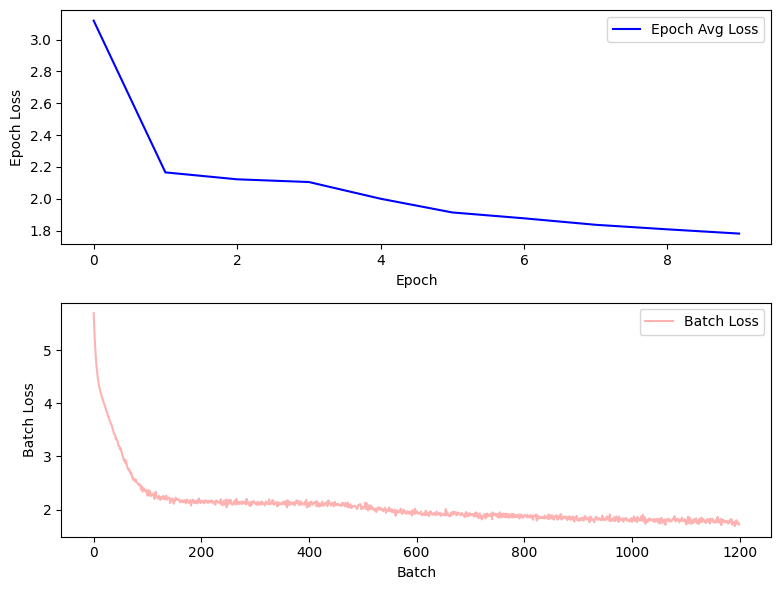

Sampling a subset of 16384 / 61096 for training
Clustering 16384 points in 8D to 64 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (0.01 s, search 0.00 s): objective=3885.42 imbalance=1.121 nsplit=0       
Sampling a subset of 16384 / 61096 for training
Clustering 16384 points in 8D to 64 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (0.01 s, search 0.00 s): objective=4471.9 imbalance=1.075 nsplit=0        
Sampling a subset of 16384 / 61096 for training
Clustering 16384 points in 8D to 64 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (0.00 s, search 0.00 s): objective=3621.87 imbalance=1.129 nsplit=0       
Sampling a subset of 16384 / 61096 for training
Clustering 16384 points in 8D to 64 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (0.01 s, search 0.00 s): objective=5102.33 imbalance=1.139 nsplit=0       
Sampling a subset of 16384 / 61096 for training


Pre-Training:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [56.443939208984375, 56.691368103027344, 54.87091827392578, 56.25649642944336, 55.3368034362793, 57.097469329833984, 55.04568099975586, 56.758338928222656, 57.335975646972656, 58.08872985839844, 54.00701904296875, 56.29996871948242, 57.138431549072266, 56.62908935546875, 58.72421646118164, 56.308937072753906] dead_rate_per_codebook[0.0, 0.0, 0.015625, 0.015625, 0.0, 0.015625, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.015625]
0.1175323948264122 1.677788496017456 0.008334987796843052 0.0013005324872210622
perplexity_per_codebook [56.181758880615234, 55.138938903808594, 54.7740592956543, 55.55147933959961, 53.92350387573242, 58.01277160644531, 54.619346618652344, 57.23818588256836, 54.823055267333984, 58.15685272216797, 57.394073486328125, 56.23678207397461, 54.23013687133789, 55.43063735961914, 51.32706069946289, 56.696964263916016] dead_rate_per_codebook[0.015625, 0.015625, 0.0, 0.03125, 0.0, 0.0, 0.015625, 0.0, 0.015625, 0.0, 0.0, 0.03125, 0.01562

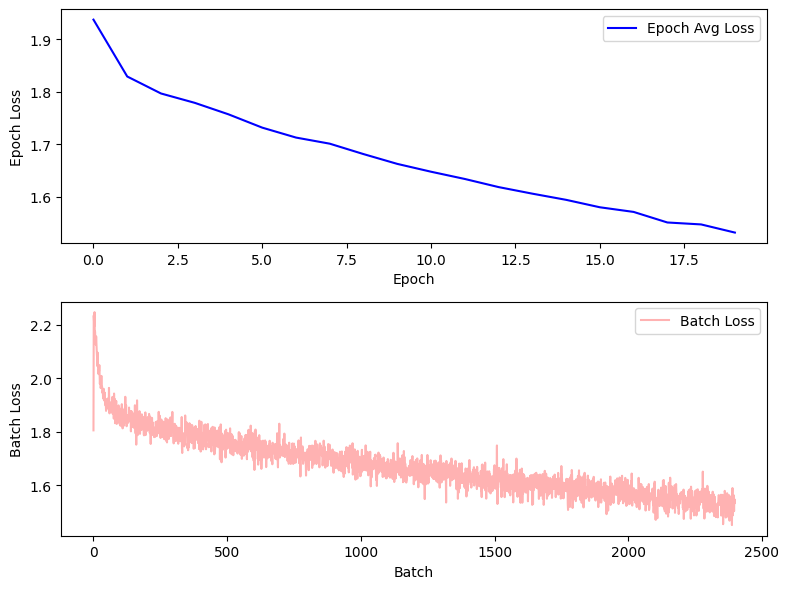

In [6]:
vqtcr = vq.vqTCR(params, adata, labels='binding_name')
vqtcr.pretrain(col_name='donor', 
               set_name=['donor_1', 'donor_2', 'donor_3', 'donor_4'],
               sample_mode='clonotype', 
               shuffle=False,
               labels=None,
               visual=True)

perplexity_per_codebook [19.78551483154297, 17.45264434814453, 23.91141700744629, 18.05860710144043, 21.972543716430664, 19.59540557861328, 20.168933868408203, 19.37330436706543, 39.82076644897461, 38.42904281616211, 42.391353607177734, 33.28439712524414, 37.9680061340332, 31.19532585144043, 47.54143524169922, 43.21998596191406] dead_rate_per_codebook[0.171875, 0.203125, 0.15625, 0.171875, 0.125, 0.25, 0.171875, 0.171875, 0.078125, 0.078125, 0.046875, 0.09375, 0.046875, 0.203125, 0.015625, 0.03125]
perplexity_per_codebook [17.745569229125977, 16.07176971435547, 20.742008209228516, 16.53511619567871, 19.927515029907227, 17.515382766723633, 17.585094451904297, 18.177431106567383, 39.53624725341797, 37.88457107543945, 40.84251403808594, 32.31772994995117, 38.13809585571289, 30.542221069335938, 44.206634521484375, 40.694705963134766] dead_rate_per_codebook[0.21875, 0.1875, 0.1875, 0.171875, 0.09375, 0.203125, 0.1875, 0.234375, 0.015625, 0.109375, 0.03125, 0.109375, 0.03125, 0.1875, 0.07812

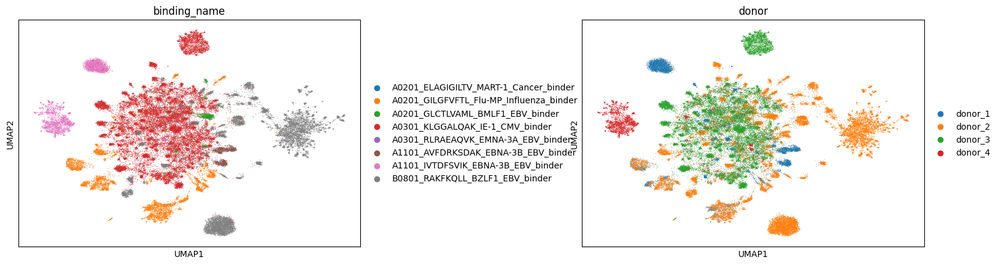

In [7]:
adata = vqtcr.get_latent(adata, col_name='donor', set_name=['donor_1', 'donor_2', 'donor_3', 'donor_4'])
# tcr latent space
sc.pp.neighbors(adata, use_rep='htcell')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['binding_name', 'donor'], wspace=0.5)

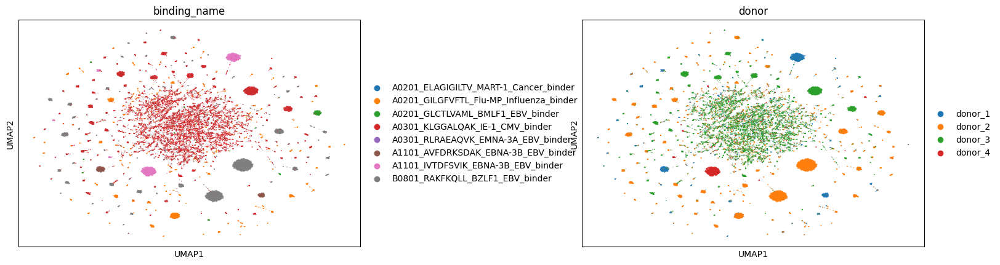

In [8]:
# tcr latent space
sc.pp.neighbors(adata, use_rep='htcr')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['binding_name', 'donor'], wspace=0.5)

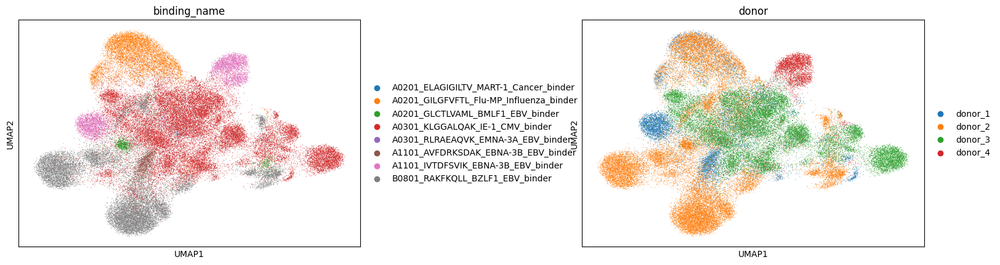

In [9]:
# gex residual latent space
sc.pp.neighbors(adata, use_rep='hgex')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['binding_name', 'donor'], wspace=0.5)

prediction training on remianing patients and test on leave-out patient

In [10]:
# test_score = vqtcr.compute_metrics(metrics='knn_prediction', eval_set='test')
record = {}
adata = vqtcr.get_latent(adata,col_name='donor', set_name=['donor_1', 'donor_2', 'donor_3', 'donor_4'])
adata_train = adata[adata.obs['set'].isin(['train', 'valid'])]
adata_valid = adata[adata.obs['set']=='test']

knn_scores = vq.get_knn_cls(adata_train.obsm['htcr'], adata_valid.obsm['htcr'],
                            adata_train.obs['binding_name'], 
                            adata_valid.obs['binding_name'])
record['knn_prediction'] = knn_scores['weighted avg']['f1-score']
record['knn_prediction']

perplexity_per_codebook [19.78551483154297, 17.45264434814453, 23.91141700744629, 18.05860710144043, 21.972543716430664, 19.59540557861328, 20.168933868408203, 19.37330436706543, 39.82076644897461, 38.42904281616211, 42.391353607177734, 33.28439712524414, 37.9680061340332, 31.19532585144043, 47.54143524169922, 43.21998596191406] dead_rate_per_codebook[0.171875, 0.203125, 0.15625, 0.171875, 0.125, 0.25, 0.171875, 0.171875, 0.078125, 0.078125, 0.046875, 0.09375, 0.046875, 0.203125, 0.015625, 0.03125]
perplexity_per_codebook [17.745569229125977, 16.07176971435547, 20.742008209228516, 16.53511619567871, 19.927515029907227, 17.515382766723633, 17.585094451904297, 18.177431106567383, 39.53624725341797, 37.88457107543945, 40.84251403808594, 32.31772994995117, 38.13809585571289, 30.542221069335938, 44.206634521484375, 40.694705963134766] dead_rate_per_codebook[0.21875, 0.1875, 0.1875, 0.171875, 0.09375, 0.203125, 0.1875, 0.234375, 0.015625, 0.109375, 0.03125, 0.109375, 0.03125, 0.1875, 0.07812

0.47366001108795963

In [11]:
adata = vq.split_adata(adata, split_col='clonotype', random_seed=2025)
record = {}
adata = vqtcr.get_latent(adata, col_name='donor', set_name=['donor_1', 'donor_2', 'donor_3', 'donor_4'])
adata_train = adata[adata.obs['set']=='train']
adata_valid = adata[adata.obs['set']=='test']

knn_scores = vq.get_knn_cls(adata_train.obsm['htcr'], adata_valid.obsm['htcr'],
                            adata_train.obs['binding_name'], 
                            adata_valid.obs['binding_name'])
record['knn_prediction'] = knn_scores['weighted avg']['f1-score']
record['knn_prediction']

perplexity_per_codebook [19.78551483154297, 17.45264434814453, 23.91141700744629, 18.05860710144043, 21.972543716430664, 19.59540557861328, 20.168933868408203, 19.37330436706543, 39.82076644897461, 38.42904281616211, 42.391353607177734, 33.28439712524414, 37.9680061340332, 31.19532585144043, 47.54143524169922, 43.21998596191406] dead_rate_per_codebook[0.171875, 0.203125, 0.15625, 0.171875, 0.125, 0.25, 0.171875, 0.171875, 0.078125, 0.078125, 0.046875, 0.09375, 0.046875, 0.203125, 0.015625, 0.03125]
perplexity_per_codebook [17.745569229125977, 16.07176971435547, 20.742008209228516, 16.53511619567871, 19.927515029907227, 17.515382766723633, 17.585094451904297, 18.177431106567383, 39.53624725341797, 37.88457107543945, 40.84251403808594, 32.31772994995117, 38.13809585571289, 30.542221069335938, 44.206634521484375, 40.694705963134766] dead_rate_per_codebook[0.21875, 0.1875, 0.1875, 0.171875, 0.09375, 0.203125, 0.1875, 0.234375, 0.015625, 0.109375, 0.03125, 0.109375, 0.03125, 0.1875, 0.07812

0.7828582352686341

In [12]:
from sklearn.model_selection import LeaveOneGroupOut, LeavePGroupsOut
logo = LeaveOneGroupOut()
all_test_metrics = []
donor_ids = adata.obs.donor.to_numpy()
import numpy as np
for train_valid_idx, test_idx in logo.split(X=adata.X, groups=donor_ids):
    test_donor = donor_ids[test_idx][0]
    print(f"\n=== test on {test_donor} ===")
    adata.obs.loc[adata.obs.index[train_valid_idx], 'set']='train'
    adata.obs.loc[adata.obs.index[test_idx], 'set'] = 'test'
    record = {}
    adata = vqtcr.get_latent(adata, col_name='donor', set_name=['donor_1', 'donor_2', 'donor_3', 'donor_4'])
    adata_train = adata[adata.obs['set']=='train']
    adata_valid = adata[adata.obs['set']=='test']

    knn_scores = vq.get_knn_cls(adata_train.obsm['htcr'], adata_valid.obsm['htcr'],
                                adata_train.obs['binding_name'], 
                                adata_valid.obs['binding_name'])
    record['knn_prediction'] = knn_scores['weighted avg']['f1-score']
    print(record['knn_prediction'])


=== test on donor_1 ===
perplexity_per_codebook [19.78551483154297, 17.45264434814453, 23.91141700744629, 18.05860710144043, 21.972543716430664, 19.59540557861328, 20.168933868408203, 19.37330436706543, 39.82076644897461, 38.42904281616211, 42.391353607177734, 33.28439712524414, 37.9680061340332, 31.19532585144043, 47.54143524169922, 43.21998596191406] dead_rate_per_codebook[0.171875, 0.203125, 0.15625, 0.171875, 0.125, 0.25, 0.171875, 0.171875, 0.078125, 0.078125, 0.046875, 0.09375, 0.046875, 0.203125, 0.015625, 0.03125]
perplexity_per_codebook [17.745569229125977, 16.07176971435547, 20.742008209228516, 16.53511619567871, 19.927515029907227, 17.515382766723633, 17.585094451904297, 18.177431106567383, 39.53624725341797, 37.88457107543945, 40.84251403808594, 32.31772994995117, 38.13809585571289, 30.542221069335938, 44.206634521484375, 40.694705963134766] dead_rate_per_codebook[0.21875, 0.1875, 0.1875, 0.171875, 0.09375, 0.203125, 0.1875, 0.234375, 0.015625, 0.109375, 0.03125, 0.109375,

In [13]:
all_test_metrics = []
for train_valid_idx, test_idx in logo.split(X=adata.X, groups=donor_ids):
    test_donor = donor_ids[test_idx][0]
    print(f"\n=== test on {test_donor} ===")
    # split train-valid dataset
    adata_train_val = adata[train_valid_idx]
    train, val = vq.split_dataset(adata_train_val, split_ratio=0.25, 
                                  split_col='clonotype', random_seed=2025)
    adata.obs['set'] = None
    adata.obs.loc[train.obs.index, 'set'] = 'train'
    adata.obs.loc[val.obs.index, 'set'] = 'valid'
    adata.obs.loc[adata.obs.index[test_idx], 'set'] = 'test'
    trainloader = vq.get_dataloader(adata=adata, 
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['train'],
                                     sample_mode='clonotype',
                                     shuffle=False, 
                                     labels='binding_name')
    validloader = vq.get_dataloader(adata=adata, 
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['valid'],
                                     sample_mode=None,
                                     shuffle=False, 
                                     labels='binding_name')
    testloader = vq.get_dataloader(adata=adata, 
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['test'],
                                     sample_mode=None,
                                     shuffle=False, 
                                     labels='binding_name')
    best_score = vqtcr.predict_train(trainloader, validloader)
    print(f'best score in validation: {best_score}')
    
    test_metrics = vqtcr.predict_test(testloader)
    all_test_metrics.append(test_metrics)
    
metric = 'weighted'
print("\n" + "="*60)
print("LOGO交叉验证最终结果:")
for i, metrics in enumerate(all_test_metrics):
        print(f"病人 {np.unique(donor_ids)[i]}: "
              f"f1: {metrics[f'f1_{metric}']:.3f}, "
              f"AUC-ROC: {metrics[f'auc_roc_{metric}']:.3f}, "
              f"AUC-PR: {metrics[f'auc_pr_{metric}']:.3f}")
    
# 计算平均性能
mean_f1 = np.nanmean([m[f'f1_{metric}'] for m in all_test_metrics])
mean_auc_roc = np.nanmean([m[f'auc_roc_{metric}'] for m in all_test_metrics])
mean_auc_pr = np.nanmean([m[f'auc_pr_{metric}'] for m in all_test_metrics])

print(f"\n平均性能: "
        f"fa: {mean_f1:.3f} ± {np.nanstd([m[f'f1_{metric}'] for m in all_test_metrics]):.3f}, "
        f"AUC-ROC: {mean_auc_roc:.3f} ± {np.nanstd([m[f'auc_roc_{metric}'] for m in all_test_metrics]):.3f}, "
        f"AUC-PR: {mean_auc_pr:.3f} ± {np.nanstd([m[f'auc_pr_{metric}'] for m in all_test_metrics]):.3f}")


=== test on donor_1 ===


Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [53.70283889770508, 58.13029098510742, 54.4627685546875, 56.775203704833984, 55.52007293701172, 51.16495132446289, 57.569000244140625, 54.24168395996094, 57.393638610839844, 54.59026336669922, 52.29875564575195, 52.566627502441406, 55.344879150390625, 54.596588134765625, 55.64564895629883, 53.91493225097656] dead_rate_per_codebook[0.015625, 0.0, 0.0, 0.0, 0.0, 0.03125, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.03125, 0.0, 0.0, 0.0, 0.0]
perplexity_per_codebook [53.24017333984375, 53.23455047607422, 55.27772903442383, 56.09513473510742, 55.733917236328125, 52.87992858886719, 57.1005973815918, 55.897281646728516, 56.75278854370117, 54.39560317993164, 50.786373138427734, 52.30276870727539, 56.11273956298828, 55.58608627319336, 55.21095275878906, 54.66718292236328] dead_rate_per_codebook[0.03125, 0.046875, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.03125, 0.0, 0.0, 0.0, 0.0]
perplexity_per_codebook [54.05254364013672, 55.185367584228516, 53.12824249267578, 57.76

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [51.54988098144531, 57.37743377685547, 52.340694427490234, 54.38719940185547, 53.44435501098633, 47.207881927490234, 54.51707458496094, 53.925262451171875, 56.502323150634766, 51.95887756347656, 46.202613830566406, 51.54412078857422, 54.394474029541016, 51.339202880859375, 56.10155487060547, 52.09613037109375] dead_rate_per_codebook[0.046875, 0.0, 0.015625, 0.015625, 0.015625, 0.0625, 0.015625, 0.015625, 0.0, 0.0, 0.03125, 0.03125, 0.0, 0.015625, 0.0, 0.0]
perplexity_per_codebook [51.23604965209961, 55.60601806640625, 53.72821044921875, 54.81565856933594, 55.752071380615234, 49.12726593017578, 55.895469665527344, 53.60421371459961, 54.89799880981445, 50.90886306762695, 48.09600067138672, 50.686973571777344, 52.430519104003906, 49.926361083984375, 53.284820556640625, 48.34755325317383] dead_rate_per_codebook[0.046875, 0.0, 0.0, 0.03125, 0.015625, 0.046875, 0.0, 0.0, 0.015625, 0.0, 0.046875, 0.03125, 0.015625, 0.015625, 0.015625, 0.03125]
perplexity_per_codebook [

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [53.501583099365234, 50.375858306884766, 51.9703483581543, 53.83959197998047, 52.075592041015625, 50.72199630737305, 53.53474807739258, 50.38134765625, 45.9844856262207, 41.36160659790039, 46.78326416015625, 43.56092834472656, 46.07075119018555, 44.24161911010742, 49.62675476074219, 49.3597526550293] dead_rate_per_codebook[0.0, 0.0, 0.015625, 0.0, 0.0, 0.03125, 0.0, 0.015625, 0.015625, 0.046875, 0.046875, 0.078125, 0.03125, 0.03125, 0.0, 0.046875]
perplexity_per_codebook [52.238739013671875, 50.192535400390625, 48.978328704833984, 51.930938720703125, 51.483375549316406, 50.95770263671875, 51.500450134277344, 47.170169830322266, 47.38593292236328, 46.85218811035156, 48.19314193725586, 46.44968032836914, 49.572174072265625, 46.0789909362793, 49.06687927246094, 50.83451461791992] dead_rate_per_codebook[0.0, 0.03125, 0.03125, 0.015625, 0.03125, 0.015625, 0.046875, 0.046875, 0.046875, 0.015625, 0.015625, 0.09375, 0.015625, 0.03125, 0.015625, 0.046875]
perplexity_per_

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [51.66943359375, 56.0104866027832, 54.199310302734375, 55.704185485839844, 55.35440444946289, 52.55809020996094, 57.270503997802734, 57.383731842041016, 55.7392578125, 50.36235809326172, 52.98006057739258, 53.85122299194336, 55.76996612548828, 56.94908905029297, 56.09941482543945, 52.59981155395508] dead_rate_per_codebook[0.046875, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.03125, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0]
perplexity_per_codebook [52.820274353027344, 55.46982192993164, 55.45054244995117, 55.62368392944336, 55.067474365234375, 51.253787994384766, 57.4476318359375, 53.66590118408203, 56.27763748168945, 52.710350036621094, 51.71980667114258, 53.14678192138672, 56.201210021972656, 54.89227294921875, 55.19081497192383, 51.313392639160156] dead_rate_per_codebook[0.015625, 0.0, 0.0, 0.0, 0.0, 0.046875, 0.0, 0.015625, 0.015625, 0.0, 0.0, 0.015625, 0.0, 0.015625, 0.015625, 0.03125]
perplexity_per_codebook [54.78249740600586, 54.657798767089844, 55.9015693664

In [14]:
all_test_metrics = []
for i in range(5):
    adata = vq.split_adata(adata, split_col='clonotype', random_seed=i)
    trainloader = vq.get_dataloader(adata=adata, 
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['train'],
                                     sample_mode='clonotype',
                                     shuffle=False, 
                                     labels='binding_name')
    validloader = vq.get_dataloader(adata=adata, 
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['valid'],
                                     sample_mode=None,
                                     shuffle=False, 
                                     labels='binding_name')
    testloader = vq.get_dataloader(adata=adata,
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['test'],
                                     sample_mode=None,
                                     shuffle=False,
                                     labels='binding_name')
    best_score = vqtcr.predict_train(trainloader, validloader)
    print(f'best score in validation: {best_score}')
    
    test_metrics = vqtcr.predict_test(testloader)
    all_test_metrics.append(test_metrics)

print("\n" + "="*60)
print("LOGO交叉验证最终结果:")
for i, metrics in enumerate(all_test_metrics):
        print(f"splite {i}: "
              f"F1: {metrics[f'f1_{metric}']:.3f}, "
              f"AUC-ROC: {metrics[f'auc_roc_{metric}']:.3f}, "
              f"AUC-PR: {metrics[f'auc_pr_{metric}']:.3f}")
    
# 计算平均性能
mean_f1 = np.nanmean([m[f'f1_{metric}'] for m in all_test_metrics])
mean_auc_roc = np.nanmean([m[f'auc_roc_{metric}'] for m in all_test_metrics])
mean_auc_pr = np.nanmean([m[f'auc_pr_{metric}'] for m in all_test_metrics])

print(f"\n平均性能: "
        f"F1: {mean_f1:.3f} ± {np.nanstd([m[f'f1_{metric}'] for m in all_test_metrics]):.3f}, "
        f"AUC-ROC: {mean_auc_roc:.3f} ± {np.nanstd([m[f'auc_roc_{metric}'] for m in all_test_metrics]):.3f}, "
        f"AUC-PR: {mean_auc_pr:.3f} ± {np.nanstd([m[f'auc_pr_{metric}'] for m in all_test_metrics]):.3f}")

    

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [52.68522262573242, 53.2367057800293, 53.7930908203125, 55.9015998840332, 55.107635498046875, 53.1473388671875, 54.317806243896484, 52.60579299926758, 55.527748107910156, 53.06153106689453, 53.86013412475586, 56.56140899658203, 56.801631927490234, 53.113338470458984, 57.284767150878906, 51.425777435302734] dead_rate_per_codebook[0.0, 0.015625, 0.0, 0.015625, 0.0, 0.03125, 0.0, 0.03125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.046875, 0.015625, 0.0]
perplexity_per_codebook [55.11002731323242, 52.32146453857422, 52.2746467590332, 59.31330871582031, 53.88313674926758, 53.07723617553711, 53.99728775024414, 54.43074417114258, 56.817726135253906, 52.851173400878906, 53.218406677246094, 51.325103759765625, 57.29943084716797, 56.6919059753418, 57.23108673095703, 50.195552825927734] dead_rate_per_codebook[0.015625, 0.0, 0.015625, 0.0, 0.015625, 0.046875, 0.015625, 0.0, 0.0, 0.015625, 0.015625, 0.015625, 0.0, 0.015625, 0.0, 0.0]
perplexity_per_codebook [53.458614349365234, 53.141155242

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [54.47052001953125, 56.18141174316406, 53.9349479675293, 56.723758697509766, 54.279380798339844, 51.15841293334961, 54.99491882324219, 53.447731018066406, 58.11518859863281, 52.512210845947266, 53.09032440185547, 50.62968826293945, 58.48751449584961, 54.798641204833984, 56.983882904052734, 51.90827560424805] dead_rate_per_codebook[0.0, 0.0, 0.015625, 0.0, 0.015625, 0.03125, 0.03125, 0.015625, 0.0, 0.015625, 0.0, 0.015625, 0.0, 0.0, 0.015625, 0.0]
perplexity_per_codebook [52.403778076171875, 56.115116119384766, 52.17303466796875, 56.909481048583984, 54.78508377075195, 49.03993225097656, 56.45322799682617, 53.1997184753418, 56.404361724853516, 50.20639419555664, 54.71929168701172, 51.63587951660156, 56.05099105834961, 55.543399810791016, 56.147396087646484, 51.5871696472168] dead_rate_per_codebook[0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.046875, 0.0, 0.0, 0.015625, 0.0]
perplexity_per_codebook [56.14742660522461, 55.9979362487793, 55.8539

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [53.61262512207031, 52.30697250366211, 53.386234283447266, 57.5753173828125, 55.105926513671875, 50.924217224121094, 55.19697570800781, 52.3853645324707, 56.07120132446289, 51.514278411865234, 52.61056900024414, 54.31121063232422, 55.63615036010742, 56.182830810546875, 54.72031021118164, 50.18865966796875] dead_rate_per_codebook[0.015625, 0.03125, 0.015625, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03125]
perplexity_per_codebook [53.59965133666992, 54.406455993652344, 53.449974060058594, 57.03303527832031, 53.98624038696289, 52.56078338623047, 57.50337600708008, 54.008888244628906, 54.07487106323242, 52.17142868041992, 51.839805603027344, 54.59189987182617, 58.37200164794922, 54.4676628112793, 56.299434661865234, 54.003746032714844] dead_rate_per_codebook[0.015625, 0.03125, 0.0, 0.0, 0.0, 0.015625, 0.015625, 0.015625, 0.03125, 0.0, 0.046875, 0.015625, 0.0, 0.0, 0.0, 0.015625]
perplexity_per_codebook [54.40510940551758, 53.6256523132

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [51.82009506225586, 54.9356575012207, 54.09114074707031, 58.34150695800781, 55.277652740478516, 51.20773696899414, 56.39207458496094, 52.276702880859375, 55.546688079833984, 51.51224899291992, 52.50164794921875, 51.88502502441406, 59.1756477355957, 56.83151626586914, 54.71250534057617, 51.89628219604492] dead_rate_per_codebook[0.03125, 0.0, 0.015625, 0.0, 0.0, 0.015625, 0.015625, 0.0, 0.0, 0.015625, 0.03125, 0.015625, 0.0, 0.0, 0.03125, 0.0]
perplexity_per_codebook [54.00312042236328, 53.44151306152344, 53.766910552978516, 55.89810562133789, 56.13692855834961, 48.27003479003906, 57.40201187133789, 52.54338455200195, 56.99271774291992, 51.925724029541016, 54.307289123535156, 54.35361099243164, 56.022640228271484, 53.8370475769043, 54.26938247680664, 53.97144317626953] dead_rate_per_codebook[0.0, 0.015625, 0.0, 0.0, 0.015625, 0.046875, 0.015625, 0.015625, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.015625, 0.015625, 0.015625]
perplexity_per_codebook [55.035919189453125, 55.33

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [53.03550338745117, 52.93603515625, 53.82329177856445, 56.8194580078125, 55.07535171508789, 51.66168975830078, 55.783050537109375, 52.714847564697266, 53.89952087402344, 49.70675277709961, 52.42894744873047, 52.83515167236328, 57.022918701171875, 56.200862884521484, 55.292442321777344, 51.95752716064453] dead_rate_per_codebook[0.0, 0.0, 0.015625, 0.0, 0.0, 0.03125, 0.015625, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0]
perplexity_per_codebook [52.41313552856445, 55.28964614868164, 55.388916015625, 55.688568115234375, 54.804420471191406, 50.76226806640625, 55.84024429321289, 54.025203704833984, 55.35915756225586, 51.13573455810547, 53.036617279052734, 53.47048568725586, 55.70365524291992, 54.383567810058594, 55.73750305175781, 51.215919494628906] dead_rate_per_codebook[0.015625, 0.0, 0.0, 0.0, 0.0, 0.03125, 0.0, 0.03125, 0.015625, 0.015625, 0.015625, 0.0, 0.015625, 0.0, 0.015625, 0.0]
perplexity_per_codebook [53.04336929321289, 53.327598571777344, 55.74